# **<center><font style="color:rgb(100,109,254)">Introduction to Face Landmarks Detection & Snap Chat Filter with Mediapipe and Python</font> </center>**



### **<font style="color:rgb(134,19,348)"> Import the Libraries</font>**

Let's start by importing the required libraries.

In [1]:
import cv2
import itertools
import numpy as np
from time import time
import mediapipe as mp
import matplotlib.pyplot as plt

Как уже упоминалось, решение Mediapipe по обнаружению ориентиров на лицах внутренне использует детектор лиц для получения необходимых областей интереса (лиц) из изображения. Итак, прежде чем перейти к обнаружению ориентиров лица, давайте сначала кратко обсудим этот детектор лиц, поскольку Mediapipe также позволяет использовать его отдельно.

## **<font style="color:rgb(134,19,348)">Распознавание лиц</font>**

[Решение Mediapipe для обнаружения лиц](https://google.github.io/mediapipe/solutions/face_detection.html) основано на детекторе лиц [BlazeFace](https://arxiv.org/abs/1907.05047), который использует очень легкая и очень точная сеть извлечения признаков, созданная на основе [MobileNetV1/V2](https://ai.googleblog.com/2018/04/mobilenetv2-next-generation-of-on.html) и использующая метод обнаружения аналогичен [Single Shot MultiBox Detector (SSD)] (https://arxiv.org/abs/1512.02325). Он способен работать со скоростью 200-1000+ FPS на флагманских устройствах. Для получения дополнительной информации вы можете просмотреть ресурсы [здесь](https://google.github.io/mediapipe/solutions/face_detection.html#resources).

### **<font style="color:rgb(134,19,348)">Инициализация модели распознавания лиц Mediapipe</font>**

Чтобы использовать решение Mediapipe для обнаружения лиц, нам сначала нужно инициализировать класс обнаружения лиц, используя синтаксис **`mp.solutions.face_detection`**, а затем нам нужно будет вызвать функцию **`mp.solutions.face_detection .FaceDetection()`** с аргументами, описанными ниже:


* **`model_selection`** — это целочисленный индекс `(т. е. 0 или 1)`. Если установлено значение «0», выбирается модель ближнего действия, которая лучше всего подходит для лиц в пределах 2 метров от камеры, а при значении «1» выбирается модель полного диапазона, которая лучше всего работает для лиц в пределах 5 метров. Его значение по умолчанию — «0».


* **`min_detection_confidence`** — это минимальная достоверность обнаружения между `([0.0, 1.0])`, необходимая для того, чтобы считать прогноз модели обнаружения лиц успешным. Его значение по умолчанию — «0,5» (т. е. 50%), что означает, что все обнаружения с достоверностью прогноза менее «0,5» по умолчанию игнорируются.


Нам также придется инициализировать класс рисования, используя синтаксис **`mp.solutions.drawing_utils`**, который используется для визуализации результатов обнаружения на изображениях/кадрах.

In [2]:
# Initialize the mediapipe face detection class.
mp_face_detection = mp.solutions.face_detection

# Setup the face detection function.
face_detection = mp_face_detection.FaceDetection(model_selection=0, min_detection_confidence=0.5)

# Initialize the mediapipe drawing class.
mp_drawing = mp.solutions.drawing_utils

### **<font style="color:rgb(134,19,348)">Читать изображение</font>**

Теперь мы воспользуемся функцией [**`cv2.imread()`**](https://docs.opencv.org/3.4/d4/da8/group__imgcodecs.html#ga288b8b3da0892bd651fce07b3bbd3a56), чтобы прочитать образец изображения и затем отобразить его. изображение с использованием библиотеки [**`matplotlib`**](https://matplotlib.org/stable/index.html) после преобразования его в RGB из формата BGR.

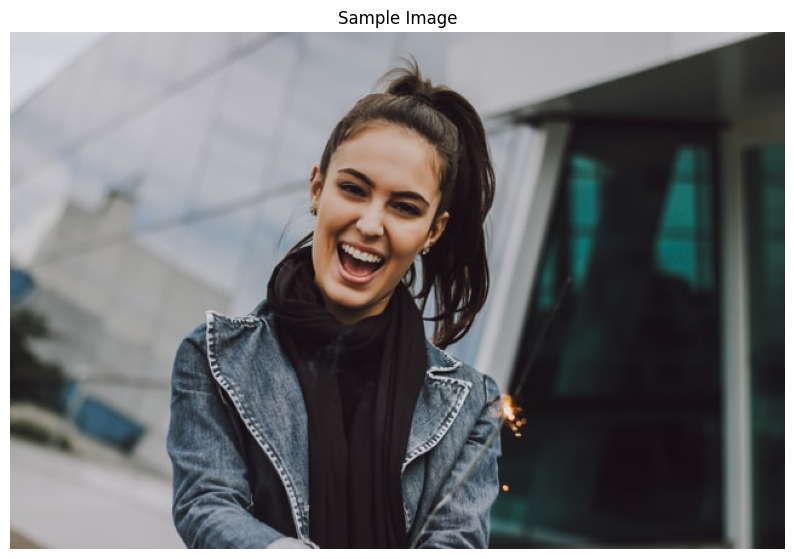

In [3]:
# Read an image from the specified path.
sample_img = cv2.imread('media/sample.jpg')

# Specify a size of the figure.
plt.figure(figsize = [10, 10])

# Display the sample image, also convert BGR to RGB for display. 
plt.title("Sample Image");plt.axis('off');plt.imshow(sample_img[:,:,::-1]);plt.show()

## **<font style="color:rgb(134,19,348)">Выполнить распознавание лиц</font>**

Теперь, чтобы выполнить обнаружение образца изображения, нам нужно будет передать изображение (в формате RGB) в загруженную модель с помощью функции **`mp.solutions.face_detection.FaceDetection().process()`* * и мы получим объект с атрибутом **`detections`**, содержащим список ограничивающей рамки и шесть ключевых точек для каждого лица на изображении. Шесть ключевых моментов заключаются в следующем:

1. **Right Eye**
2. **Left Eye**
3. **Nose Tip**
4. **Mouth Center** 
5. **Right Ear Tragion** 
6. **Left Ear Tragion**

После выполнения обнаружения мы отобразим координаты ограничивающего прямоугольника и только первые две ключевые точки каждого обнаруженного лица на изображении, чтобы вы получили больше представления о формате вывода.

In [4]:
# Perform face detection after converting the image into RGB format.
face_detection_results = face_detection.process(sample_img[:,:,::-1])

# Check if the face(s) in the image are found.
if face_detection_results.detections:
    
    # Iterate over the found faces.
    for face_no, face in enumerate(face_detection_results.detections):
        
        # Display the face number upon which we are iterating upon.
        print(f'FACE NUMBER: {face_no+1}')
        print('---------------------------------')
        
        # Display the face confidence.
        print(f'FACE CONFIDENCE: {round(face.score[0], 2)}')
        
        # Get the face bounding box and face key points coordinates.
        face_data = face.location_data
        
        # Display the face bounding box coordinates.
        print(f'\nFACE BOUNDING BOX:\n{face_data.relative_bounding_box}')
        
        # Iterate two times as we only want to display first two key points of each detected face.
        for i in range(2):

            # Display the found normalized key points.
            print(f'{mp_face_detection.FaceKeyPoint(i).name}:')
            print(f'{face_data.relative_keypoints[mp_face_detection.FaceKeyPoint(i).value]}') 

FACE NUMBER: 1
---------------------------------
FACE CONFIDENCE: 0.98

FACE BOUNDING BOX:
xmin: 0.39702365
ymin: 0.27627468
width: 0.16100731
height: 0.24132276

RIGHT_EYE:
x: 0.436854
y: 0.3198586

LEFT_EYE:
x: 0.51124376
y: 0.35651308



**Note:** *The bounding boxes are composed of `xmin` and `width` (both normalized to `[0.0, 1.0]` by the image width) and `ymin` and `height` (both normalized to `[0.0, 1.0]` by the image height). Each keypoint is composed of `x` and `y`, which are normalized to `[0.0, 1.0]` by the image width and height respectively.*

Now we will draw the detected bounding box(es) and the key points on a copy of the sample image using the function **`mp.solutions.drawing_utils.draw_detection()`** from the class **`mp.solutions.drawing_utils`**, we had initialized earlier and will display the resultant image using the matplotlib library. 

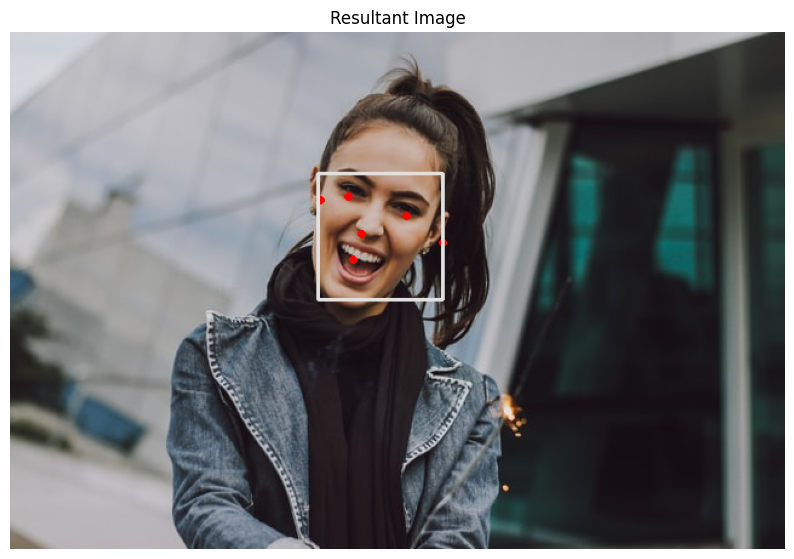

In [5]:
# Create a copy of the sample image to draw the bounding box and key points.
img_copy = sample_img[:,:,::-1].copy()

# Check if the face(s) in the image are found.
if face_detection_results.detections:
    
    # Iterate over the found faces.
    for face_no, face in enumerate(face_detection_results.detections):
        
        # Draw the face bounding box and key points on the copy of the sample image.
        mp_drawing.draw_detection(image=img_copy, detection=face, 
                                 keypoint_drawing_spec=mp_drawing.DrawingSpec(color=(255, 0, 0),
                                                                              thickness=2,
                                                                              circle_radius=2))
# Specify a size of the figure.
fig = plt.figure(figsize = [10, 10])

# Display the resultant image with the bounding box and key points drawn, 
# also convert BGR to RGB for display. 
plt.title("Resultant Image");plt.axis('off');plt.imshow(img_copy);plt.show()

**Примечание:** *Хотя детектор довольно точно обнаруживает лица, но не может точно обнаружить ключевые точки лица (ориентиры) в некоторых сценариях (например, для нефронтальных, повернутых или закрытых лиц), поэтому мы будем нам нужно решение Mediapipe для обнаружения ориентиров на лицах для создания фильтра Snapchat, что является нашей главной целью.*

## **<font style="color:rgb(134,19,348)">Обнаружение ориентиров на лицах</font>**

Теперь давайте перейдем к обнаружению ориентиров лица. Мы начнем с инициализации модели обнаружения ориентиров лица.

### **<font style="color:rgb(134,19,348)">Инициализация модели обнаружения ориентиров лица в Mediapipe</font>**

Чтобы инициализировать модель обнаружения ориентиров лица Mediapipe, нам нужно будет инициализировать класс сетки лица, используя синтаксис **`mp.solutions.face_mesh`**, а затем нам нужно будет вызвать функцию **`mp.solutions.face_mesh. FaceMesh()`** с аргументами, описанными ниже:

* **`static_image_mode`** — это логическое значение. Если установлено значение «False», решение обрабатывает входные изображения как видеопоток. Он попытается обнаружить лица на первых входных изображениях и в случае успешного обнаружения дополнительно локализует ориентиры лиц. На последующих изображениях, когда все лица **`max_num_faces`** обнаружены и соответствующие ориентиры лиц локализованы, он просто отслеживает эти ориентиры, не вызывая другого обнаружения, пока не потеряет отслеживание любого из лиц. Это уменьшает задержку и идеально подходит для обработки видеокадров. Если установлено значение «True», распознавание лиц выполняется для каждого входного изображения, что идеально подходит для обработки пакета статических, возможно, несвязанных изображений. Его значение по умолчанию — «False».


* **`max_num_faces`** — максимальное количество лиц, которые можно обнаружить. Его значение по умолчанию — `1`.


* **`min_detection_confidence`** — это минимальная достоверность обнаружения `([0.0, 1.0])`, необходимая для того, чтобы считать прогноз модели обнаружения лиц правильным. Его значение по умолчанию — «0,5», что означает, что все обнаружения с достоверностью прогноза менее 50 % по умолчанию игнорируются.


* **`min_tracking_confidence`** — это минимальная достоверность отслеживания `([0.0, 1.0])` из модели отслеживания ориентиров, чтобы ориентиры лица считались отслеживаемыми успешно, иначе распознавание лиц будет автоматически вызвано на следующее входное изображение, поэтому увеличение его значения увеличивает надежность, но также увеличивает задержку. Он игнорируется, если **`static_image_mode`** имеет значение True, где распознавание лиц просто выполняется для каждого изображения. Его значение по умолчанию — «0,5».

После этого мы инициализируем класс **`mp.solutions.drawing_styles`**, который позволит нам получать различные стили рисования ориентиров на изображениях/кадрах.

In [6]:
# Initialize the mediapipe face mesh class.
mp_face_mesh = mp.solutions.face_mesh

# Setup the face landmarks function for images.
face_mesh_images = mp_face_mesh.FaceMesh(static_image_mode=True, max_num_faces=2,
                                         min_detection_confidence=0.5)

# Setup the face landmarks function for videos.
face_mesh_videos = mp_face_mesh.FaceMesh(static_image_mode=False, max_num_faces=1, 
                                         min_detection_confidence=0.5,min_tracking_confidence=0.3)

# Initialize the mediapipe drawing styles class.
mp_drawing_styles = mp.solutions.drawing_styles

## **<font style="color:rgb(134,19,348)">Выполнить обнаружение ориентиров лица</font>**

Теперь, чтобы выполнить обнаружение ориентиров, мы передадим изображение (в формате RGB) в конвейер машинного обучения обнаружения ориентиров лица, используя функцию **`mp.solutions.face_mesh.FaceMesh().process()`** и получите список из **четыреста шестидесяти восьми** лицевых ориентиров для каждого обнаруженного лица на изображении. Каждая достопримечательность будет иметь:

* **`x`** — это координата x ориентира, нормированная на [0,0, 1,0] по ширине изображения.

* **`y`** — это координата y ориентира, нормированная на [0,0, 1,0] по высоте изображения.

* **`z`** — это координата z ориентира, нормализованная примерно до того же масштаба, что и **`x`**. Он представляет глубину ориентира, при этом центр головы является началом координат, и чем меньше значение, тем ближе ориентир к камере.


Мы будем отображать только два ориентира каждого глаза, чтобы получить представление о формате вывода. Конвейер ml выводит объект с атрибутом **`multi_face_landmarks`**, который содержит координаты найденных ориентиров каждого лица в качестве элемента список.

In [7]:
# Perform face landmarks detection after converting the image into RGB format.
face_mesh_results = face_mesh_images.process(sample_img[:,:,::-1])

# Get the list of indexes of the left and right eye.
LEFT_EYE_INDEXES = list(set(itertools.chain(*mp_face_mesh.FACEMESH_LEFT_EYE)))
RIGHT_EYE_INDEXES = list(set(itertools.chain(*mp_face_mesh.FACEMESH_RIGHT_EYE)))

# Check if facial landmarks are found.
if face_mesh_results.multi_face_landmarks:
    
    # Iterate over the found faces.
    for face_no, face_landmarks in enumerate(face_mesh_results.multi_face_landmarks):
        
        # Display the face number upon which we are iterating upon.
        print(f'FACE NUMBER: {face_no+1}')
        print('-----------------------')
        
        # Display the face part name i.e., left eye whose landmarks we are gonna display.
        print(f'LEFT EYE LANDMARKS:\n')
        
        # Iterate over the first two landmarks indexes of the left eye.
        for LEFT_EYE_INDEX in LEFT_EYE_INDEXES[:2]:
            
            # Display the found normalized landmarks of the left eye.
            print(face_landmarks.landmark[LEFT_EYE_INDEX])
        
        # Display the face part name i.e., right eye whose landmarks we are gonna display.
        print(f'RIGHT EYE LANDMARKS:\n')
        
        # Iterate over the first two landmarks indexes of the right eye.
        for RIGHT_EYE_INDEX in RIGHT_EYE_INDEXES[:2]:
            
            # Display the found normalized landmarks of the right eye.
            print(face_landmarks.landmark[RIGHT_EYE_INDEX])

FACE NUMBER: 1
-----------------------
LEFT EYE LANDMARKS:

x: 0.49976224
y: 0.33403876
z: -0.0035511951

x: 0.5056224
y: 0.33465478
z: -0.0052535245

RIGHT EYE LANDMARKS:

x: 0.43839282
y: 0.2998622
z: -0.0014929706

x: 0.43043235
y: 0.30033028
z: 0.006076946



**Примечание.** *Координата Z — это просто относительное расстояние ориентира от центра головы, и это расстояние увеличивается и уменьшается в зависимости от расстояния от камеры, поэтому она представляет глубину каждого ориентира. точка.*

Теперь мы нарисуем обнаруженные ориентиры на копии образца изображения, используя функцию **`mp.solutions.drawing_utils.draw_landmarks()`** из класса **`mp.solutions.drawing_utils`**, который мы инициализировали. ранее и отобразит полученное изображение. Функция **`mp.solutions.drawing_utils.draw_landmarks()`** может принимать следующие аргументы.

* **`image`** - изображение в формате RGB, на котором будут нарисованы ориентиры.


* **`landmark_list`** — это нормализованный список ориентиров, который должен быть нарисован на изображении.


* **`connections`** — это список кортежей индексов ориентиров, который определяет, как ориентиры следует соединить на чертеже. Предоставленные варианты: `mp_face_mesh.FACEMESH_FACE_OVAL, mp_face_mesh.FACEMESH_LEFT_EYE, mp_face_mesh.FACEMESH_LEFT_EYEBROW, mp_face_mesh.FACEMESH_LIPS, mp_face_mesh.FACEMESH_RIGHT_EYE, mp_face_mesh.FACEMESH_RIGHT_EYEBROW, mp_face _mesh.FACEMESH_TESSELATION, mp_face_mesh.FACEMESH_CONTOURS`.
    
    
* **`landmark_drawing_spec`** — определяет настройки рисования ориентиров, такие как цвет, толщина линий и радиус окружности. Его можно установить равным объекту `mp.solutions.drawing_utils.DrawingSpec(color, Thickness, Circle_radius))`.


* **`connection_drawing_spec`** — определяет параметры рисования соединений, такие как цвет и толщина линий. Это может быть либо объект `mp.solutions.drawing_utils.DrawingSpec`, либо функция из класса `mp.solutions.drawing_styles`. В настоящее время предусмотрены следующие параметры сетки лица: `get_default_face_mesh_contours_style()`,`get_default_face_mesh_tesselation_style()`.

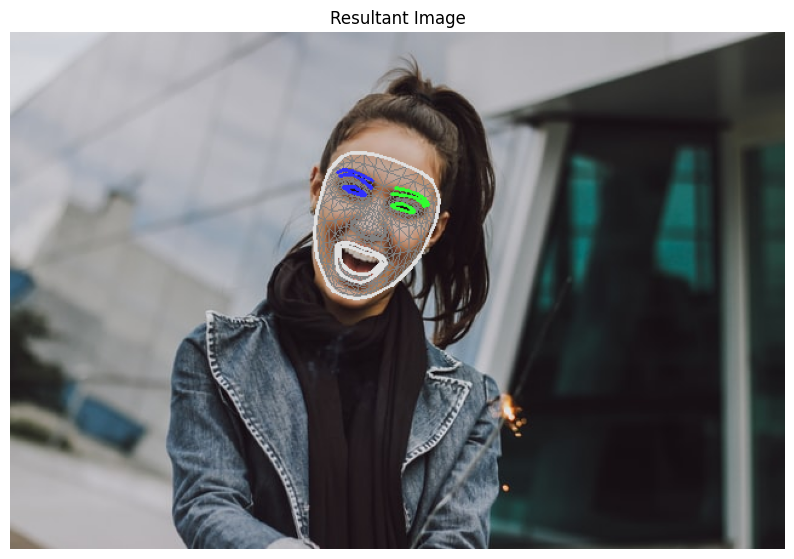

In [8]:
# Create a copy of the sample image in RGB format to draw the found facial landmarks on.
img_copy = sample_img[:,:,::-1].copy()

# Check if facial landmarks are found.
if face_mesh_results.multi_face_landmarks:
    
    # Iterate over the found faces.
    for face_landmarks in face_mesh_results.multi_face_landmarks:
        
        # Draw the facial landmarks on the copy of the sample image with the
        # face mesh tesselation connections using default face mesh tesselation style.
        mp_drawing.draw_landmarks(image=img_copy, 
                                  landmark_list=face_landmarks,connections=mp_face_mesh.FACEMESH_TESSELATION,
                                  landmark_drawing_spec=None, 
                                  connection_drawing_spec=mp_drawing_styles.get_default_face_mesh_tesselation_style())
        
        # Draw the facial landmarks on the copy of the sample image with the
        # face mesh contours connections using default face mesh contours style.
        mp_drawing.draw_landmarks(image=img_copy, landmark_list=face_landmarks,connections=mp_face_mesh.FACEMESH_CONTOURS,
                                  landmark_drawing_spec=None, 
                                  connection_drawing_spec=mp_drawing_styles.get_default_face_mesh_contours_style())
        
# Specify a size of the figure.
fig = plt.figure(figsize = [10, 10])

# Display the resultant image with the face mesh drawn. 
plt.title("Resultant Image");plt.axis('off');plt.imshow(img_copy);plt.show()

### **<font style="color:rgb(134,19,348)">Создание функции обнаружения ориентиров лица</font>**

Теперь мы соединим все это вместе, чтобы создать функцию **`detectFacialLandmarks()`**, которая будет выполнять обнаружение ориентиров лица на изображении и визуализировать результирующее изображение вместе с исходным изображением или возвращать результирующее изображение вместе с выводом модель в зависимости от переданных аргументов.

In [9]:
def detectFacialLandmarks(image, face_mesh, display = True):
    '''
    This function performs facial landmarks detection on an image.
    Args:
        image:     The input image of person(s) whose facial landmarks needs to be detected.
        face_mesh: The face landmarks detection function required to perform the landmarks detection.
        display:   A boolean value that is if set to true the function displays the original input image, 
                   and the output image with the face landmarks drawn and returns nothing.
    Returns:
        output_image: A copy of input image with face landmarks drawn.
        results:      The output of the facial landmarks detection on the input image.
    '''
    
    # Perform the facial landmarks detection on the image, after converting it into RGB format.
    results = face_mesh.process(image[:,:,::-1])
    
    # Create a copy of the input image to draw facial landmarks.
    output_image = image[:,:,::-1].copy()
    
    # Check if facial landmarks in the image are found.
    if results.multi_face_landmarks:

        # Iterate over the found faces.
        for face_landmarks in results.multi_face_landmarks:

            # Draw the facial landmarks on the output image with the face mesh tesselation
            # connections using default face mesh tesselation style.
            mp_drawing.draw_landmarks(image=output_image, landmark_list=face_landmarks,
                                      connections=mp_face_mesh.FACEMESH_TESSELATION,
                                      landmark_drawing_spec=None, 
                                      connection_drawing_spec=mp_drawing_styles.get_default_face_mesh_tesselation_style())

            # Draw the facial landmarks on the output image with the face mesh contours
            # connections using default face mesh contours style.
            mp_drawing.draw_landmarks(image=output_image, landmark_list=face_landmarks,
                                      connections=mp_face_mesh.FACEMESH_CONTOURS,
                                      landmark_drawing_spec=None, 
                                      connection_drawing_spec=mp_drawing_styles.get_default_face_mesh_contours_style())

    # Check if the original input image and the output image are specified to be displayed.
    if display:
        
        # Display the original input image and the output image.
        plt.figure(figsize=[15,15])
        plt.subplot(121);plt.imshow(image[:,:,::-1]);plt.title("Original Image");plt.axis('off');
        plt.subplot(122);plt.imshow(output_image);plt.title("Output");plt.axis('off');
        
    # Otherwise
    else:
        
        # Return the output image in BGR format and results of facial landmarks detection.
        return np.ascontiguousarray(output_image[:,:,::-1], dtype=np.uint8), results              

Теперь мы будем использовать функцию **`detectFacialLandmarks()`**, созданную выше, чтобы выполнить обнаружение ориентиров лица на нескольких примерах изображений и отобразить результаты.

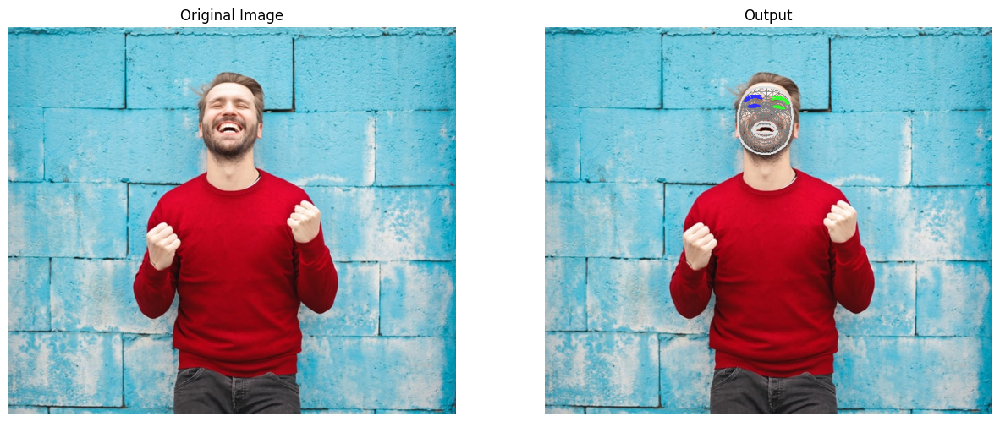

In [10]:
# Read a sample image and perform facial landmarks detection on it.
image = cv2.imread('media/sample1.jpg')
detectFacialLandmarks(image, face_mesh_images, display=True)

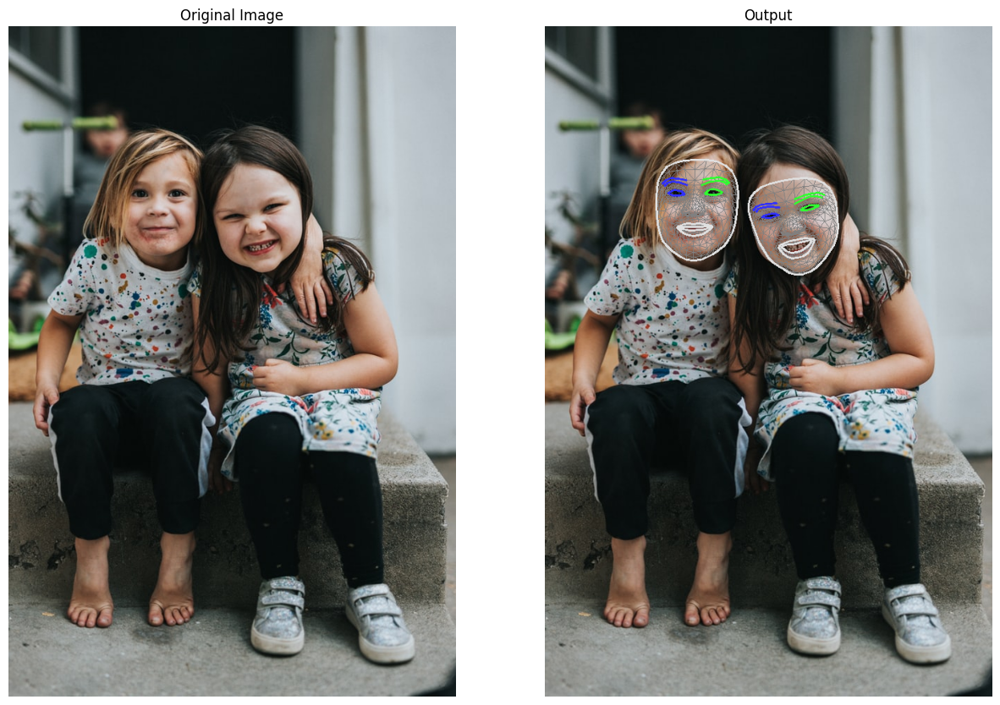

In [11]:
# Read another sample image and perform facial landmarks detection on it.
image = cv2.imread('media/sample2.jpg')
detectFacialLandmarks(image, face_mesh_images, display=True)

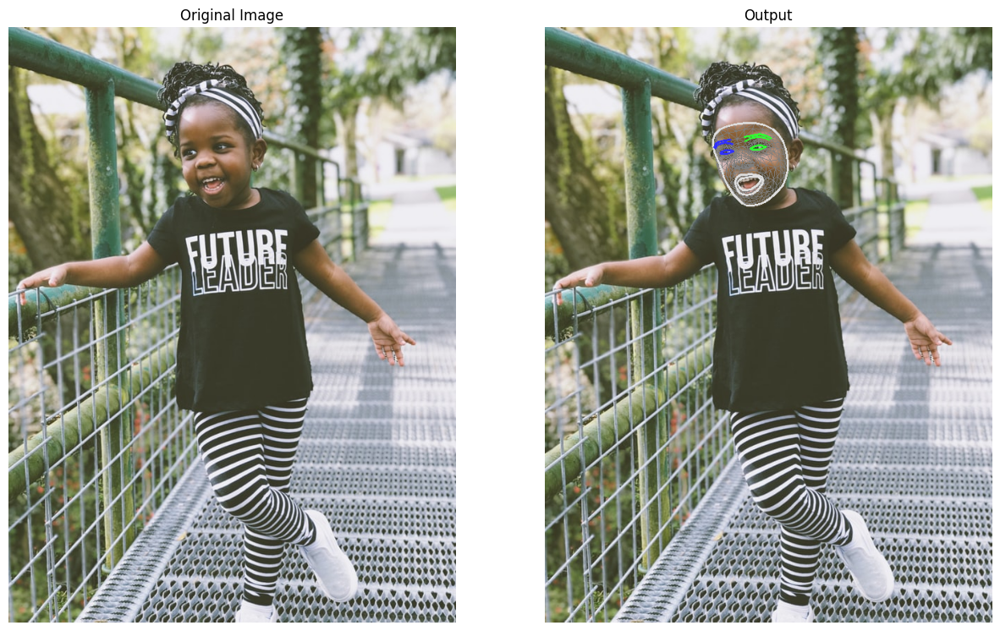

In [12]:
# Read another sample image and perform facial landmarks detection on it.
image = cv2.imread('media/sample3.jpg')
detectFacialLandmarks(image, face_mesh_images, display=True)

### **<font style="color:rgb(134,19,348)">Обнаружение ориентиров лиц при трансляции с веб-камеры в реальном времени</font>**

Результаты на изображениях были замечательными, но теперь мы попробуем эту функцию на трансляции с веб-камеры в реальном времени. Мы также рассчитаем и отобразим количество кадров, обновляемых за одну секунду, чтобы понять, может ли это решение работать в реальном времени на процессоре или нет.

In [13]:
# Initialize the VideoCapture object to read from the webcam.
camera_video = cv2.VideoCapture(0)
camera_video.set(3,1280)
camera_video.set(4,960)

# Create named window for resizing purposes.
cv2.namedWindow('Face Landmarks Detection', cv2.WINDOW_NORMAL)

# Initialize a variable to store the time of the previous frame.
time1 = 0

# Iterate until the webcam is accessed successfully.
while camera_video.isOpened():
    
    # Read a frame.
    ok, frame = camera_video.read()
    
    # Check if frame is not read properly then continue to the next iteration to 
    # read the next frame.
    if not ok:
        continue
    
    # Flip the frame horizontally for natural (selfie-view) visualization.
    frame = cv2.flip(frame, 1)
    
    # Perform Face landmarks detection.
    frame, _ = detectFacialLandmarks(frame, face_mesh_videos, display=False)
    
    # Set the time for this frame to the current time.
    time2 = time()
    
    # Check if the difference between the previous and this frame time > 0 to avoid 
    # division by zero.
    if (time2 - time1) > 0:
    
        # Calculate the number of frames per second.
        frames_per_second = 1.0 / (time2 - time1)
        
        # Write the calculated number of frames per second on the frame. 
        cv2.putText(frame, 'FPS: {}'.format(int(frames_per_second)), (10, 30),
                    cv2.FONT_HERSHEY_PLAIN, 2, (0, 255, 0), 3)
    
    # Update the previous frame time to this frame time.
    # As this frame will become previous frame in next iteration.
    time1 = time2
    
    # Display the frame.
    cv2.imshow('Face Landmarks Detection', frame)
    
    # Wait for 1ms. If a key is pressed, retreive the ASCII code of the key.
    k = cv2.waitKey(1) & 0xFF    
    
    # Check if 'ESC' is pressed and break the loop.
    if(k == 27):
        break

# Release the VideoCapture Object and close the windows.                  
camera_video.release()
cv2.destroyAllWindows()

Впечатляющий! решение быстрое и точное.

## **<font style="color:rgb(134,19,348)">Распознавание выражений лиц</font>**

Теперь, когда у нас есть обнаруженные ориентиры, мы будем использовать их для распознавания выражений лиц людей на изображениях/видео, используя классические методы. Наш распознаватель сможет распознавать следующие выражения лица:

* **Глаза открыты или закрыты** 😳 (*можно использовать для проверки <font style="color:rgb(255,140,0)"> **сонливости**</font>, <font style="color:rgb (255,140,0)">**подмигивание**</font> или <font style="color:rgb(255,140,0)">**выражение шока**</font>*)

* **Рот открыт или закрыт** 😱 (*можно использовать для проверки <font style="color:rgb(255,140,0)">**зевания**</font>*)

Для простоты мы ограничим это только двумя выражениями. Но если вы хотите, вы можете легко расширить это приложение, чтобы оно могло распознавать больше выражений лица, просто добавив больше условных операторов или, возможно, объединив эти два условия. Например, широко открытые глаза и рот могут обозначать выражение <font style="color:rgb(255,140,0)">**удивление**</font>.

### **<font style="color:rgb(134,19,348)">Создание функции для расчета размера части лица</font>**

Сначала мы создадим функцию **`getSize()`**, которая будет использовать обнаруженные ориентиры для расчета размера части лица. Все, что нам нужно, это найти способ изолировать ориентиры части лица, и, к счастью, это можно легко сделать с помощью объектов замороженных наборов (атрибуты класса **`mp.solutions.face_mesh`**), которые содержат необходимые индексы.


* **`mp_face_mesh.FACEMESH_FACE_OVAL`** содержит индексы <font style="color:rgb(0,200,0)">**контура лица**</font>.
</центр>

* **`mp_face_mesh.FACEMESH_LIPS`** содержит индексы <font style="color:rgb(0,200,0)">**губ**</font>.

* **`mp_face_mesh.FACEMESH_LEFT_EYE`** содержит индексы <font style="color:rgb(0,200,0)">**левого глаза**</font>.

* **`mp_face_mesh.FACEMESH_RIGHT_EYE`** содержит индексы <font style="color:rgb(0,200,0)">**правого глаза**</font>.

* **`mp_face_mesh.FACEMESH_LEFT_EYEBROW`** содержит индексы <font style="color:rgb(0,200,0)">**левой брови**</font>.

* **`mp_face_mesh.FACEMESH_RIGHT_EYEBROW`** содержит индексы <font style="color:rgb(0,200,0)">**правой брови**</font>.

После получения ориентиров части лица мы просто передадим их в функцию [**`cv2.boundingRect()`**](https://docs.opencv.org/4.5.3/d3/dc0/group__imgproc__shape .html#ga103fcbda2f540f3ef1c042d6a9b35ac7), чтобы получить ширину и высоту лицевой части. Функция **`cv2.boundingRect(landmarks)`** возвращает координаты **(`x1`, `y1`, `width`, `height`)** ограничивающей рамки, охватывающей объект (часть лица), учитывая ориентиры, но нам понадобятся только **`высота`** и **`ширина`** ограничивающей рамки.

In [14]:
def getSize(image, face_landmarks, INDEXES):
    '''
    This function calculate the height and width of a face part utilizing its landmarks.
    Args:
        image:          The image of person(s) whose face part size is to be calculated.
        face_landmarks: The detected face landmarks of the person whose face part size is to 
                        be calculated.
        INDEXES:        The indexes of the face part landmarks, whose size is to be calculated.
    Returns:
        width:     The calculated width of the face part of the face whose landmarks were passed.
        height:    The calculated height of the face part of the face whose landmarks were passed.
        landmarks: An array of landmarks of the face part whose size is calculated.
    '''
    
    # Retrieve the height and width of the image.
    image_height, image_width, _ = image.shape
    
    # Convert the indexes of the landmarks of the face part into a list.
    INDEXES_LIST = list(itertools.chain(*INDEXES))
    
    # Initialize a list to store the landmarks of the face part.
    landmarks = []
    
    # Iterate over the indexes of the landmarks of the face part. 
    for INDEX in INDEXES_LIST:
        
        # Append the landmark into the list.
        landmarks.append([int(face_landmarks.landmark[INDEX].x * image_width),
                               int(face_landmarks.landmark[INDEX].y * image_height)])
    
    # Calculate the width and height of the face part.
    _, _, width, height = cv2.boundingRect(np.array(landmarks))
    
    # Convert the list of landmarks of the face part into a numpy array.
    landmarks = np.array(landmarks)
    
    # Retrurn the calculated width height and the landmarks of the face part.
    return width, height, landmarks

Теперь мы создадим функцию **`isOpen()`**, которая будет использовать функцию **`getSize()`**, которую мы создали выше, чтобы проверить, является ли часть лица (например, рот или глаз) человека открыт или закрыт.

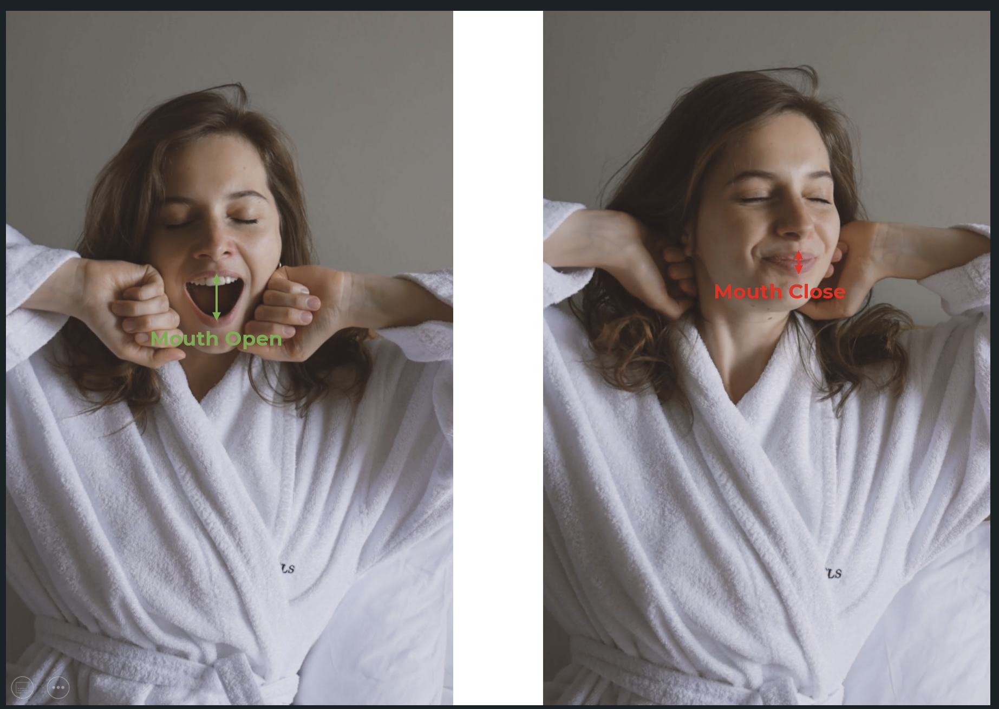

**Подсказка:** *Высота открытого рта или глаза будет больше высоты закрытого рта или глаза.*

In [15]:
def isOpen(image, face_mesh_results, face_part, threshold=5, display=True):
    '''
    This function checks whether the an eye or mouth of the person(s) is open, 
    utilizing its facial landmarks.
    Args:
        image:             The image of person(s) whose an eye or mouth is to be checked.
        face_mesh_results: The output of the facial landmarks detection on the image.
        face_part:         The name of the face part that is required to check.
        threshold:         The threshold value used to check the isOpen condition.
        display:           A boolean value that is if set to true the function displays 
                           the output image and returns nothing.
    Returns:
        output_image: The image of the person with the face part is opened  or not status written.
        status:       A dictionary containing isOpen statuses of the face part of all the 
                      detected faces.  
    '''
    
    # Retrieve the height and width of the image.
    image_height, image_width, _ = image.shape
    
    # Create a copy of the input image to write the isOpen status.
    output_image = image.copy()
    
    # Create a dictionary to store the isOpen status of the face part of all the detected faces.
    status={}
    
    # Check if the face part is mouth.
    if face_part == 'MOUTH':
        
        # Get the indexes of the mouth.
        INDEXES = mp_face_mesh.FACEMESH_LIPS
        
        # Specify the location to write the is mouth open status.
        loc = (10, image_height - image_height//40)
        
        # Initialize a increment that will be added to the status writing location, 
        # so that the statuses of two faces donot overlap. 
        increment=-30
        
    # Check if the face part is left eye.    
    elif face_part == 'LEFT EYE':
        
        # Get the indexes of the left eye.
        INDEXES = mp_face_mesh.FACEMESH_LEFT_EYE
        
        # Specify the location to write the is left eye open status.
        loc = (10, 30)
        
        # Initialize a increment that will be added to the status writing location, 
        # so that the statuses of two faces donot overlap.
        increment=30
    
    # Check if the face part is right eye.    
    elif face_part == 'RIGHT EYE':
        
        # Get the indexes of the right eye.
        INDEXES = mp_face_mesh.FACEMESH_RIGHT_EYE 
        
        # Specify the location to write the is right eye open status.
        loc = (image_width-300, 30)
        
        # Initialize a increment that will be added to the status writing location, 
        # so that the statuses of two faces donot overlap.
        increment=30
    
    # Otherwise return nothing.
    else:
        return
    
    # Iterate over the found faces.
    for face_no, face_landmarks in enumerate(face_mesh_results.multi_face_landmarks):
        
         # Get the height of the face part.
        _, height, _ = getSize(image, face_landmarks, INDEXES)
        
         # Get the height of the whole face.
        _, face_height, _ = getSize(image, face_landmarks, mp_face_mesh.FACEMESH_FACE_OVAL)
        
        # Check if the face part is open.
        if (height/face_height)*100 > threshold:
            
            # Set status of the face part to open.
            status[face_no] = 'OPEN'
            
            # Set color which will be used to write the status to green.
            color=(0,255,0)
        
        # Otherwise.
        else:
            # Set status of the face part to close.
            status[face_no] = 'CLOSE'
            
            # Set color which will be used to write the status to red.
            color=(0,0,255)
        
        # Write the face part isOpen status on the output image at the appropriate location.
        cv2.putText(output_image, f'FACE {face_no+1} {face_part} {status[face_no]}.', 
                    (loc[0],loc[1]+(face_no*increment)), cv2.FONT_HERSHEY_PLAIN, 1.4, color, 2)
                
    # Check if the output image is specified to be displayed.
    if display:

        # Display the output image.
        plt.figure(figsize=[10,10])
        plt.imshow(output_image[:,:,::-1]);plt.title("Output Image");plt.axis('off');
    
    # Otherwise
    else:
        
        # Return the output image and the isOpen statuses of the face part of each detected face.
        return output_image, status

Теперь мы воспользуемся функцией **`isOpen()`**, созданной выше, чтобы проверить состояние рта и глаз на нескольких примерах изображений и отобразить результаты.

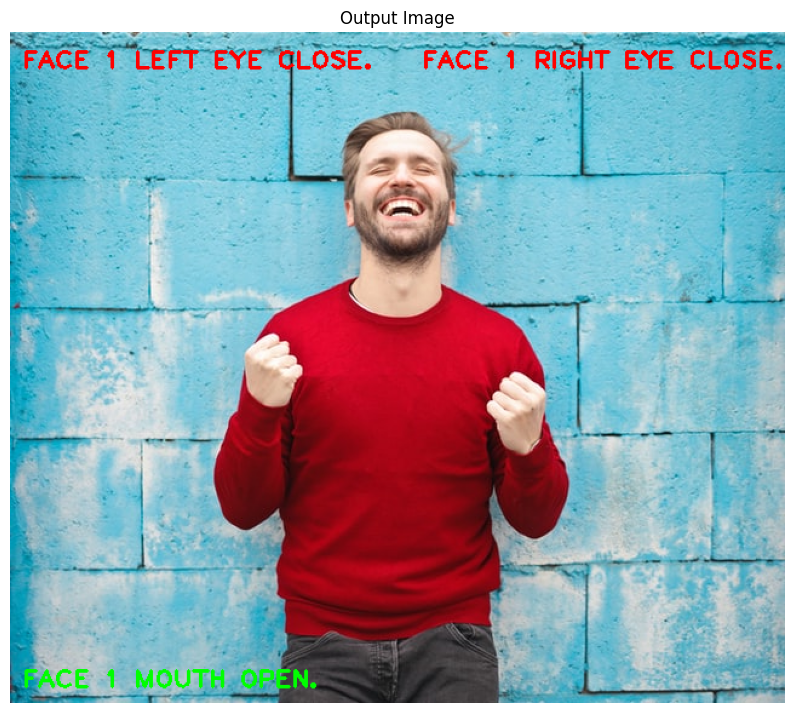

In [16]:
# Read another sample image and perform facial expression recognition on it.
image = cv2.imread('media/sample1.jpg')
image = cv2.flip(image, 1)
_, face_mesh_results = detectFacialLandmarks(image, face_mesh_images, display=False)
if face_mesh_results.multi_face_landmarks:
    output_image, _ = isOpen(image, face_mesh_results, 'MOUTH', threshold=15, display=False)
    output_image, _ = isOpen(output_image, face_mesh_results, 'LEFT EYE', threshold=5, display=False)
    isOpen(output_image, face_mesh_results, 'RIGHT EYE', threshold=5)

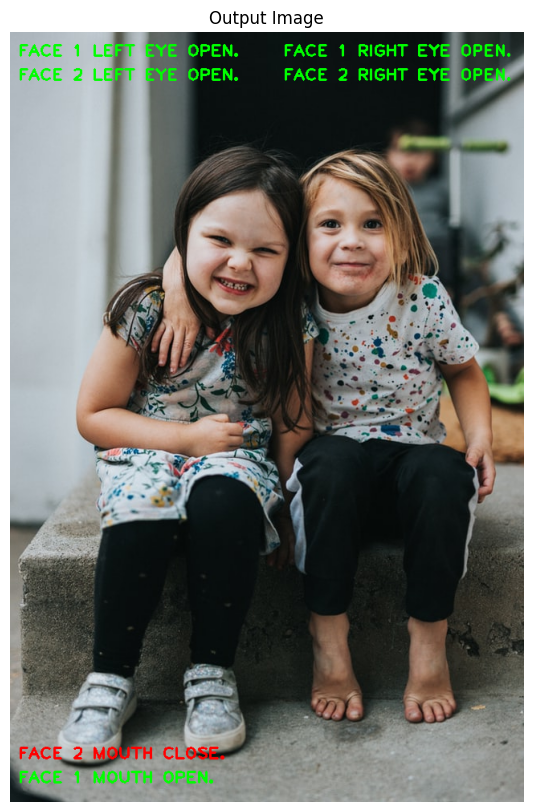

In [17]:
# Read another sample image and perform facial expression recognition on it.
image = cv2.imread('media/sample2.jpg')
image = cv2.flip(image, 1)
_, face_mesh_results = detectFacialLandmarks(image, face_mesh_images, display=False)
if face_mesh_results.multi_face_landmarks:
    output_image, _ = isOpen(image, face_mesh_results, 'MOUTH', threshold=15, display=False)
    output_image, _ = isOpen(output_image, face_mesh_results, 'LEFT EYE', threshold=5, display=False)
    isOpen(output_image, face_mesh_results, 'RIGHT EYE', threshold=5)

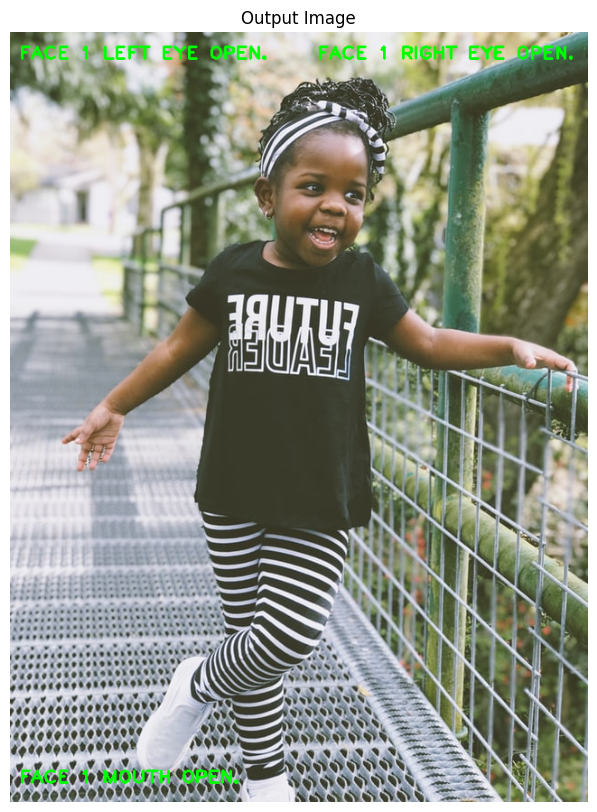

In [18]:
# Read another sample image and perform facial expression recognition on it.
image = cv2.imread('media/sample3.jpg')
image = cv2.flip(image, 1)
_, face_mesh_results = detectFacialLandmarks(image, face_mesh_images, display=False)
if face_mesh_results.multi_face_landmarks:
    output_image, _ = isOpen(image, face_mesh_results, 'MOUTH', threshold=15, display=False)
    output_image, _ = isOpen(output_image, face_mesh_results, 'LEFT EYE', threshold=5, display=False)
    isOpen(output_image, face_mesh_results, 'RIGHT EYE', threshold=5)

Как и ожидалось, результаты впечатляют!

## **<font style="color:rgb(134,19,348)">Фильтр Snapchat, управляемый выражениями лица</font>**

Теперь, когда у нас есть распознаватель выражений лица, давайте начнем создавать поверх него фильтр Snapchat, который будет запускаться на основе выражений лица человека в режиме реального времени.

В настоящее время наш распознаватель выражений лица может проверять, открыты ли глаза и рот `😯` или нет `😌`, поэтому, чтобы получить максимальную отдачу от этого, мы можем накладывать масштабируемые изображения глаз `👀` поверх глаз пользователя, когда его глаза открыты и видео огня `🔥`, выходящего изо рта пользователя, когда рот открыт.

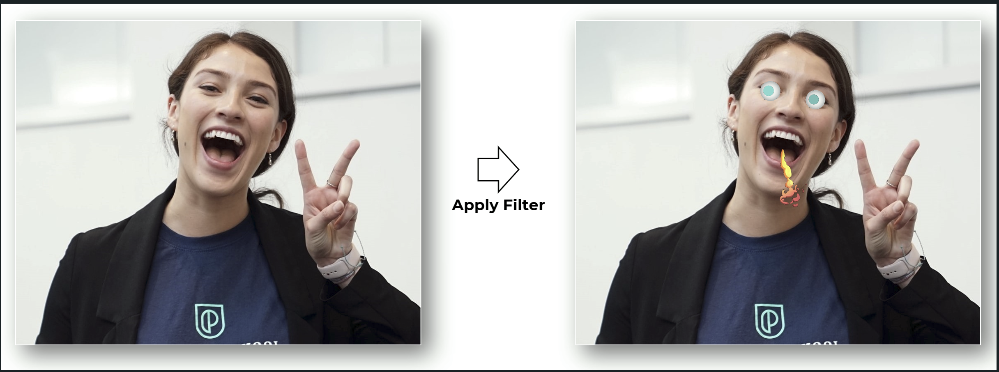


### **<font style="color:rgb(134,19,348)">Создание функции для наложения фильтров изображения</font>**

Теперь мы создадим функцию **`overlay()`**, которая будет применять фильтры поверх глаз и рта человека на изображениях/видео, используя ориентиры лица для определения частей лица, а также будет изменять размер изображений фильтра. в зависимости от размера части лица, на которую будут наложены изображения фильтра.

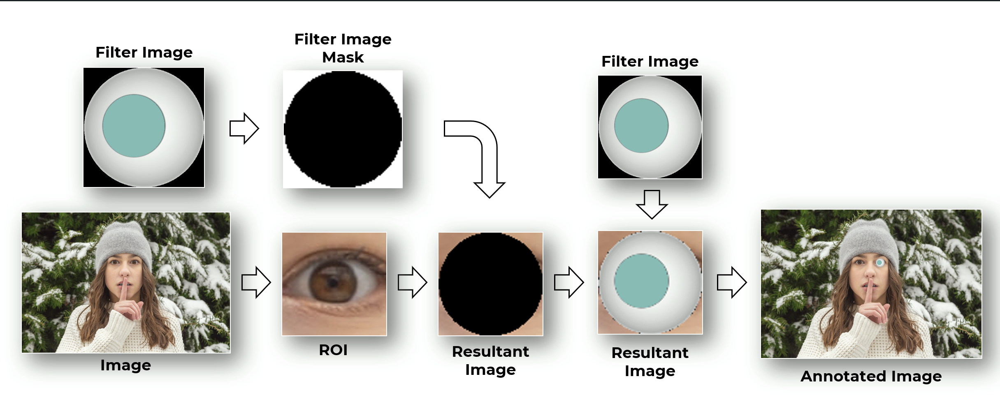

In [19]:
def overlay(image, filter_img, face_landmarks, face_part, INDEXES, display=True):
    '''
    This function will overlay a filter image over a face part of a person in the image/frame.
    Args:
        image:          The image of a person on which the filter image will be overlayed.
        filter_img:     The filter image that is needed to be overlayed on the image of the person.
        face_landmarks: The facial landmarks of the person in the image.
        face_part:      The name of the face part on which the filter image will be overlayed.
        INDEXES:        The indexes of landmarks of the face part.
        display:        A boolean value that is if set to true the function displays 
                        the annotated image and returns nothing.
    Returns:
        annotated_image: The image with the overlayed filter on the top of the specified face part.
    '''
    
    # Create a copy of the image to overlay filter image on.
    annotated_image = image.copy()
    
    # Errors can come when it resizes the filter image to a too small or a too large size .
    # So use a try block to avoid application crashing.
    try:
    
        # Get the width and height of filter image.
        filter_img_height, filter_img_width, _  = filter_img.shape

        # Get the height of the face part on which we will overlay the filter image.
        _, face_part_height, landmarks = getSize(image, face_landmarks, INDEXES)
        
        # Specify the height to which the filter image is required to be resized.
        required_height = int(face_part_height*2.5)
        
        # Resize the filter image to the required height, while keeping the aspect ratio constant. 
        resized_filter_img = cv2.resize(filter_img, (int(filter_img_width*
                                                         (required_height/filter_img_height)),
                                                     required_height))
        
        # Get the new width and height of filter image.
        filter_img_height, filter_img_width, _  = resized_filter_img.shape

        # Convert the image to grayscale and apply the threshold to get the mask image.
        _, filter_img_mask = cv2.threshold(cv2.cvtColor(resized_filter_img, cv2.COLOR_BGR2GRAY),
                                           25, 255, cv2.THRESH_BINARY_INV)

        # Calculate the center of the face part.
        center = landmarks.mean(axis=0).astype("int")

        # Check if the face part is mouth.
        if face_part == 'MOUTH':

            # Calculate the location where the smoke filter will be placed.  
            location = (int(center[0] - filter_img_width / 3), int(center[1]))

        # Otherwise if the face part is an eye.
        else:

            # Calculate the location where the eye filter image will be placed.  
            location = (int(center[0]-filter_img_width/2), int(center[1]-filter_img_height/2))

        # Retrieve the region of interest from the image where the filter image will be placed.
        ROI = image[location[1]: location[1] + filter_img_height,
                    location[0]: location[0] + filter_img_width]

        # Perform Bitwise-AND operation. This will set the pixel values of the region where,
        # filter image will be placed to zero.
        resultant_image = cv2.bitwise_and(ROI, ROI, mask=filter_img_mask)

        # Add the resultant image and the resized filter image.
        # This will update the pixel values of the resultant image at the indexes where 
        # pixel values are zero, to the pixel values of the filter image.
        resultant_image = cv2.add(resultant_image, resized_filter_img)

        # Update the image's region of interest with resultant image.
        annotated_image[location[1]: location[1] + filter_img_height,
                        location[0]: location[0] + filter_img_width] = resultant_image
            
    # Catch and handle the error(s).
    except Exception as e:
        pass
    
    # Check if the annotated image is specified to be displayed.
    if display:

        # Display the annotated image.
        plt.figure(figsize=[10,10])
        plt.imshow(annotated_image[:,:,::-1]);plt.title("Output Image");plt.axis('off');
    
    # Otherwise
    else:
            
        # Return the annotated image.
        return annotated_image

### **<font style="color:rgb(134,19,348)">Фильтр Snapchat в канале с веб-камеры в реальном времени</font>**

Теперь мы воспользуемся функцией **`overlay()`**, созданной выше, для применения фильтров на основе выражений лица, которые мы распознаем с помощью функции **`isOpen()`** на изображении с веб-камеры в реальном времени.

In [21]:
# Initialize the VideoCapture object to read from the webcam.
camera_video = cv2.VideoCapture(0)
camera_video.set(3,1280)
camera_video.set(4,960)

# Create named window for resizing purposes.
cv2.namedWindow('Face Filter', cv2.WINDOW_NORMAL)

# Read the left and right eyes images.
left_eye = cv2.imread('media/left_eye.png')
right_eye = cv2.imread('media/right_eye.png')

# Initialize the VideoCapture object to read from the smoke animation video stored in the disk.
smoke_animation = cv2.VideoCapture('media/smoke_animation.mp4')

# Set the smoke animation video frame counter to zero.
smoke_frame_counter = 0

# Iterate until the webcam is accessed successfully.
while camera_video.isOpened():
    
    # Read a frame.
    ok, frame = camera_video.read()
    
    # Check if frame is not read properly then continue to the next iteration to read
    # the next frame.
    if not ok:
        continue
        
    # Read a frame from smoke animation video
    _, smoke_frame = smoke_animation.read()
    
    # Increment the smoke animation video frame counter.
    smoke_frame_counter += 1
    
    # Check if the current frame is the last frame of the smoke animation video.
    if smoke_frame_counter == smoke_animation.get(cv2.CAP_PROP_FRAME_COUNT):     
        
        # Set the current frame position to first frame to restart the video.
        smoke_animation.set(cv2.CAP_PROP_POS_FRAMES, 0)
        
        # Set the smoke animation video frame counter to zero.
        smoke_frame_counter = 0
    
    # Flip the frame horizontally for natural (selfie-view) visualization.
    frame = cv2.flip(frame, 1)
    
    # Perform Face landmarks detection.
    _, face_mesh_results = detectFacialLandmarks(frame, face_mesh_videos, display=False)
    
    # Check if facial landmarks are found.
    if face_mesh_results.multi_face_landmarks:
        
        # Get the mouth isOpen status of the person in the frame.
        _, mouth_status = isOpen(frame, face_mesh_results, 'MOUTH', 
                                     threshold=15, display=False)
        
        # Get the left eye isOpen status of the person in the frame.
        _, left_eye_status = isOpen(frame, face_mesh_results, 'LEFT EYE', 
                                        threshold=4.5 , display=False)
        
        # Get the right eye isOpen status of the person in the frame.
        _, right_eye_status = isOpen(frame, face_mesh_results, 'RIGHT EYE', 
                                         threshold=4.5, display=False)
        
        # Iterate over the found faces.
        for face_num, face_landmarks in enumerate(face_mesh_results.multi_face_landmarks):
            
            # Check if the left eye of the face is open.
            if left_eye_status[face_num] == 'OPEN':
                
                # Overlay the left eye image on the frame at the appropriate location.
                frame = overlay(frame, left_eye, face_landmarks,
                                'LEFT EYE', mp_face_mesh.FACEMESH_LEFT_EYE, display=False)
            
            # Check if the right eye of the face is open.
            if right_eye_status[face_num] == 'OPEN':
                
                # Overlay the right eye image on the frame at the appropriate location.
                frame = overlay(frame, right_eye, face_landmarks,
                                'RIGHT EYE', mp_face_mesh.FACEMESH_RIGHT_EYE, display=False)
            
            # Check if the mouth of the face is open.
            if mouth_status[face_num] == 'OPEN':
                
                # Overlay the smoke animation on the frame at the appropriate location.
                frame = overlay(frame, smoke_frame, face_landmarks, 
                                'MOUTH', mp_face_mesh.FACEMESH_LIPS, display=False)
    
    # Display the frame.
    cv2.imshow('Face Filter', frame)
    
    # Wait for 1ms. If a key is pressed, retreive the ASCII code of the key.
    k = cv2.waitKey(1) & 0xFF    
    
    # Check if 'ESC' is pressed and break the loop.
    if(k == 27):
        break

# Release the VideoCapture Object and close the windows.                  
camera_video.release()
cv2.destroyAllWindows()